# Singing Voice Activity Detection in Wagner's "Ring" - Semantic Analyses

This notebook presents some analyses and visualization of singing voice activity detection results in Wagner's "Ring".

Author: Christof Weiß, AudioLabs Erlangen 2019


In [1]:
import glob
import os
import numpy as np
from scipy import signal
import pandas as pd
import sklearn.ensemble
import IPython.display as ipd
import librosa
from collections import OrderedDict

from matplotlib import pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as gridspec

%matplotlib inline

## Load audio, annotations, and voice activity detection results

Test piece: WWV 86 B 1 - "Die Walküre"

In [2]:
audio_file_name = os.path.join('D:', os.sep, 'WagnerLyrics','wav_22050_stereo', 'Wagner_WWV086B-1_Karajan1966_DG1998.wav')
# annot_file_name = os.path.join('D:', os.sep, 'WagnerLyrics','Annotations_SingingVoice_Audio', 'Wagner_WWV086B-1_Karajan1966_LyricsAnnotated.csv')
annot_file_name = os.path.join('D:', os.sep, 'WagnerLyrics','Annotations_SingingVoice_Audio', 'Wagner_WWV086B-1_Karajan1966_LyricsAnnotated_Corrected.csv')
results_path = os.path.join('H:', os.sep, 'workspace','python','ISAD_wagner_vad','wagner_vad','results','split_b')

res_file = '0m_cnn_results.npy'
# res_file = 'lr_pcen_results.npy'
# res_file = 'pcen_results.npy'
# res_file = 'schl_model_results.npy'
gt_file = 'vad_true_targets.npy'

res_file_name = os.path.join(results_path, res_file)
gt_file_name = os.path.join(results_path, gt_file)

results = np.load(res_file_name)
ground_truth = np.load(gt_file_name)
annotationTable = pd.read_csv(annot_file_name, sep='/')
f_audio, Fs = librosa.load(audio_file_name, sr=None)

print('Length Results: '+str(results.shape[0]/(Fs*60))+' minutes.')
print('Length Annotations: '+str(ground_truth.shape[0]/(Fs*60))+' minutes.')
print('Length Audio: '+str(f_audio.shape[0]/(Fs*60))+' minutes.')

assert results.shape==ground_truth.shape, 'Results and ground truth have different shape!'

ipd.display(ipd.Audio(data=f_audio[0:(Fs*20)], rate=Fs))

Length Results: 67.3 minutes.
Length Annotations: 67.3 minutes.
Length Audio: 67.3 minutes.


## Quantitative Evaluation - Sample-wise

for verification of numbers...

In [3]:
num_samples = ground_truth.shape[0]
ground_truth_inverted = 1-ground_truth

frame_rate = 10 # Hz
hop_length = Fs//frame_rate
length_in_frames = librosa.samples_to_frames(num_samples, hop_length=hop_length)

precision = np.dot(results, ground_truth)/np.sum(results)
recall = np.dot(results, ground_truth)/np.sum(ground_truth)
f_meas = 2*precision*recall / (precision+recall)
accuracy = np.sum(results==ground_truth)/num_samples
error_rate = np.sum(results==ground_truth_inverted)/num_samples

print('*** Sample-based results: ***')
print('Precision:   %.3f ' % (precision))
print('Recall:      %.3f ' % (recall))
print('F-Measure:   %.3f' % (f_meas))
print('Accuracy:   %.3f %%' % (100*accuracy))
print('Error rate: %.3f %%' % (100*error_rate))

*** Sample-based results: ***
Precision:   0.843 
Recall:      0.858 
F-Measure:   0.850
Accuracy:   83.718 %
Error rate: 16.282 %


## Quantitative Evaluation - Frame-wise

for verification of numbers in frame-wise manner ...

In [4]:
results_fw = np.around(np.mean(librosa.util.frame(results, frame_length=hop_length, hop_length=hop_length), axis=0))
ground_truth_fw = np.around(np.mean(librosa.util.frame(ground_truth, frame_length=hop_length, hop_length=hop_length), axis=0))
ground_truth_inverted_fw = 1-ground_truth_fw

num_frames = results_fw.shape[0]

precision_fw = np.dot(results_fw, ground_truth_fw)/np.sum(results_fw)
recall_fw = np.dot(results_fw, ground_truth_fw)/np.sum(ground_truth_fw)
f_meas_fw = 2*precision_fw*recall_fw / (precision_fw+recall_fw)
accuracy_fw = np.sum(results_fw==ground_truth_fw)/num_frames
error_rate_fw = np.sum(results_fw==ground_truth_inverted_fw)/num_frames

print('*** Frame-based results: ***')
print('Precision:   %.3f ' % (precision_fw))
print('Recall:      %.3f ' % (recall_fw))
print('F-Measure:   %.3f' % (f_meas_fw))
print('Accuracy:   %.3f %%' % (100*accuracy_fw))
print('Error rate: %.3f %%' % (100*error_rate_fw))

*** Frame-based results: ***
Precision:   0.843 
Recall:      0.863 
F-Measure:   0.853
Accuracy:   83.947 %
Error rate: 16.053 %


## Visualization - sample-wise

false positives: 8.6 %
false negatives: 7.7 %


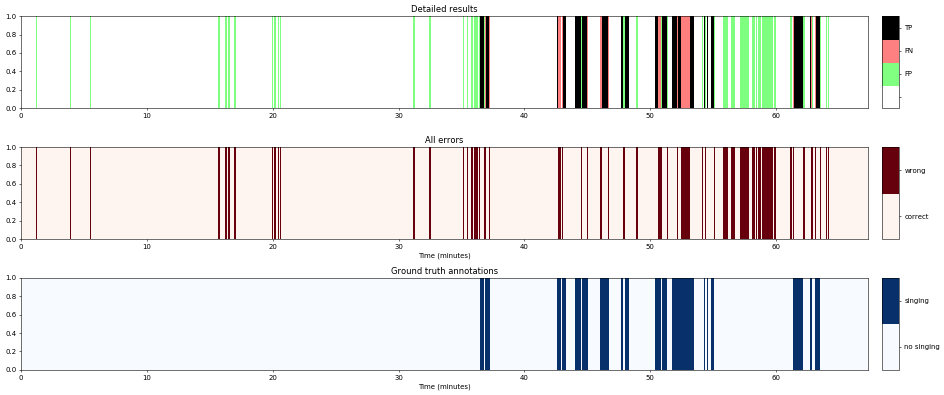

In [5]:
true_pos = np.multiply((results==ground_truth), ground_truth)
false_neg = np.multiply((results==0), (ground_truth==1))
false_pos = np.multiply((results==1), (ground_truth==0))

print('false positives: %.1f %%' % (100*np.sum(false_pos)/num_samples))
print('false negatives: %.1f %%' % (100*np.sum(false_neg)/num_samples))

all_errors = np.reshape(results!=ground_truth, [1, num_samples])
ground_truth_labels = np.reshape(ground_truth, [1, num_samples])

# discrete_cmap = colors.ListedColormap([[1, 1, 1], [1, 0.3, 0.3], [1, 0.7, 0.7], [0, 0, 0]])    # "FMP-map"
discrete_cmap = colors.ListedColormap([[1, 1, 1], [0.5, 1, 0.5], [1, 0.5, 0.5], [0, 0, 0]])
blues = plt.cm.get_cmap('Blues')
reds = plt.cm.get_cmap('Reds')

t_min_minutes = 0
t_max_minutes = num_samples/(Fs*60)

plt.figure(figsize=(19, 8), dpi=50)
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

bounds = np.array([0, 1, 2, 3, 4])-0.5
norm = colors.BoundaryNorm(bounds, discrete_cmap.N)
boundsReds = np.array([0, 1, 2])-0.5
normReds = colors.BoundaryNorm(boundsReds, reds.N)
boundsBlues = np.array([0, 1, 2])-0.5
normBlues = colors.BoundaryNorm(boundsBlues, blues.N)

visualization = np.reshape(3 * true_pos + 2 * false_neg + 1 * false_pos, [1, num_samples])
im = ax0.imshow(visualization, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax1, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax0.set_title('Detailed results')

im = ax2.imshow(all_errors, origin='lower', aspect='auto', cmap=reds, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax3, cmap=reds, norm=normReds, boundaries=boundsReds, ticks=[0, 1])
cbar.ax.set_yticklabels(['correct', 'wrong'])
ax2.set_xlabel('Time (minutes)')
ax2.set_title('All errors')

im = ax4.imshow(ground_truth_labels, origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax5, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax4.set_title('Ground truth annotations')
ax4.set_xlabel('Time (minutes)')


plt.tight_layout()
plt.show()

## Visualization - Frame-wise

false positives: 8.7 %
false negatives: 7.4 %


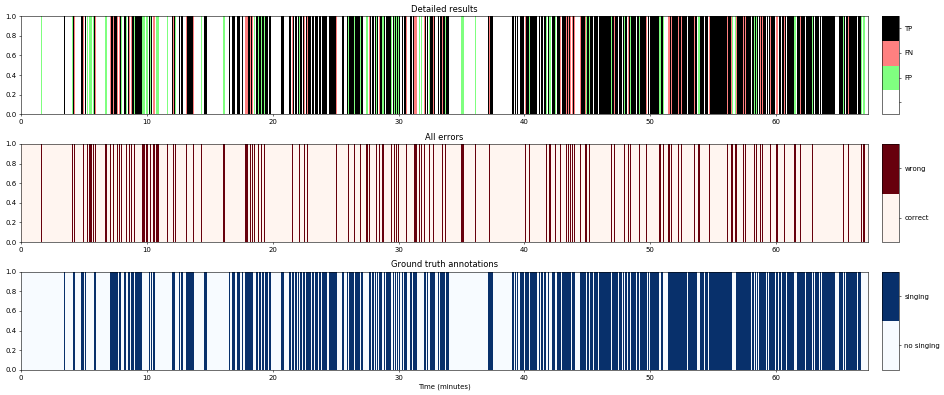

In [6]:
true_pos_fw = np.multiply((results_fw==ground_truth_fw), ground_truth_fw)
false_neg_fw = np.multiply((results_fw==0), (ground_truth_fw==1))
false_pos_fw = np.multiply((results_fw==1), (ground_truth_fw==0))

print('false positives: %.1f %%' % (100*np.sum(false_pos_fw)/num_frames))
print('false negatives: %.1f %%' % (100*np.sum(false_neg_fw)/num_frames))

all_errors_fw = np.reshape(results_fw!=ground_truth_fw, [1, num_frames])
ground_truth_labels_fw = np.reshape(ground_truth_fw, [1, num_frames])

# discrete_cmap = colors.ListedColormap([[1, 1, 1], [1, 0.3, 0.3], [1, 0.7, 0.7], [0, 0, 0]])    # "FMP-map"
discrete_cmap = colors.ListedColormap([[1, 1, 1], [0.5, 1, 0.5], [1, 0.5, 0.5], [0, 0, 0]])
blues = plt.cm.get_cmap('Blues')
reds = plt.cm.get_cmap('Reds')

t_min_minutes = 0
t_max_minutes = num_frames/(frame_rate*60)

plt.figure(figsize=(19, 8), dpi=50)
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

bounds = np.array([0, 1, 2, 3, 4])-0.5
norm = colors.BoundaryNorm(bounds, discrete_cmap.N)
visualization_fw = np.reshape(3 * true_pos_fw + 2 * false_neg_fw + 1 * false_pos_fw, [1, num_frames])
im = ax0.imshow(visualization_fw, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax1, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax0.set_title('Detailed results')

im = ax2.imshow(all_errors_fw, origin='lower', aspect='auto', cmap=reds, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax3, cmap=reds, norm=normReds, boundaries=boundsReds, ticks=[0, 1])
cbar.ax.set_yticklabels(['correct', 'wrong'])
ax2.set_title('All errors')

im = ax4.imshow(ground_truth_labels_fw, origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax5, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax4.set_title('Ground truth annotations')
ax4.set_xlabel('Time (minutes)')

plt.tight_layout()
plt.show()

### Use annotation table as reference

... containing also person and lyrics annotations

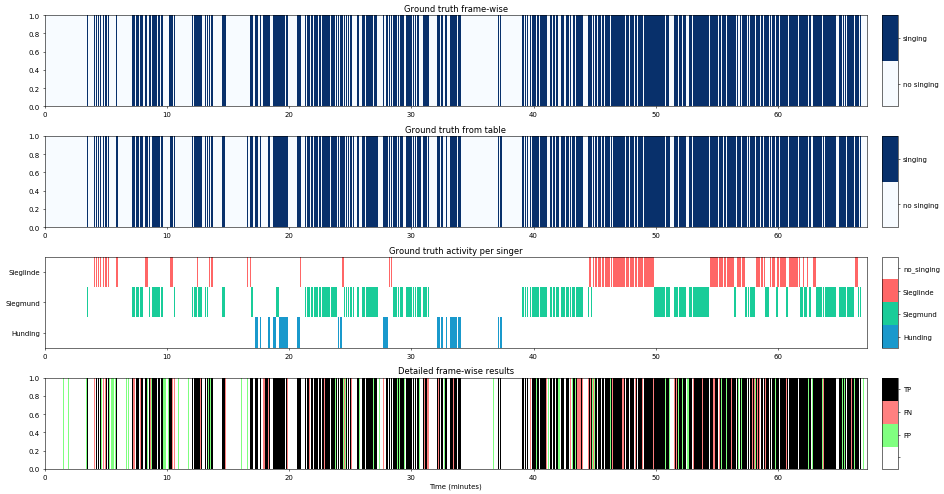

*** Frame-based results with annotations from table: ***
Precision:   0.865 
Recall:      0.856 
F-Measure:   0.860
Accuracy:   84.497 %
Error rate: 15.503 %


In [7]:
column_names = annotationTable.iloc[0]

ground_truth_from_table = np.zeros((1, length_in_frames))
activity_sieglinde = np.zeros((1, length_in_frames))
activity_siegmund = np.zeros((1, length_in_frames))
activity_hunding = np.zeros((1, length_in_frames))

for line_num in range(annotationTable.shape[0]):

    time_start_sec = annotationTable.at[line_num,'Time_Start']
    time_start_frames = librosa.time_to_frames(time_start_sec, sr=Fs, hop_length=hop_length) # -100000
    time_end_sec = annotationTable.at[line_num,'Time_End']
    time_end_frames = librosa.time_to_frames(time_end_sec, sr=Fs, hop_length=hop_length) +1 # +100000
    
    ground_truth_from_table[:,time_start_frames:time_end_frames] = 1
    
    if annotationTable.at[line_num,'Person'] in 'Sieglinde':
        activity_sieglinde[:,time_start_frames:time_end_frames] = 1
    elif annotationTable.at[line_num,'Person'] in 'Siegmund':
        activity_siegmund[:,time_start_frames:time_end_frames] = 2
    elif annotationTable.at[line_num,'Person'] in 'Hunding':
        activity_hunding[:,time_start_frames:time_end_frames] = 3

activity_by_singer = np.concatenate((activity_hunding, activity_siegmund, activity_sieglinde), axis=0)

discrete_cmap2 = colors.ListedColormap([[1, 1, 1], [1, 0.4, 0.4], [0.1, 0.8, 0.6], [0.1, 0.6, 0.8]])
blues_discrete = colors.ListedColormap([[1, 1, 1], [0.2, 0.2, 1]])

plt.figure(figsize=(19, 10), dpi=50)
gs = gridspec.GridSpec(4, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])
ax6 = plt.subplot(gs[3, 0])
ax7 = plt.subplot(gs[3, 1])

# show individual singers' plots sequentially

# im = ax0.imshow(activity_sieglinde, interpolation='none', origin='lower', aspect='auto', cmap=blues_discrete)#, extent=[t_min_minutes, t_max_minutes, 0, 1])
# cbar = plt.colorbar(im, cax=ax1, cmap=blues, ticks=[0, 1])
# cbar.ax.set_yticklabels(['no singing', 'singing'])
# ax2.set_xlabel('Time (minutes)')

# im = ax2.imshow(activity_siegmund, interpolation='none', origin='lower', aspect='auto', cmap=blues_discrete)#, extent=[t_min_minutes, t_max_minutes, 0, 1])
# cbar = plt.colorbar(im, cax=ax3, cmap=blues, ticks=[0, 1])
# cbar.ax.set_yticklabels(['no singing', 'singing'])
# ax2.set_xlabel('Time (minutes)')

# im = ax4.imshow(activity_hunding, interpolation='none', origin='lower', aspect='auto', cmap=blues_discrete)#, extent=[t_min_minutes, t_max_minutes, 0, 1])
# cbar = plt.colorbar(im, cax=ax5, cmap=blues, ticks=[0, 1])
# cbar.ax.set_yticklabels(['no singing', 'singing'])
# ax2.set_xlabel('Time (minutes)')

# show one multi-singer plot

bounds = np.array([0, 1, 2, 3, 4])-0.5
norm = colors.BoundaryNorm(bounds, discrete_cmap.N)
im = ax0.imshow(ground_truth_labels_fw, origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax1, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax0.set_title('Ground truth frame-wise')

im = ax2.imshow(ground_truth_from_table, origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax3, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax2.set_title('Ground truth from table')

im = ax4.imshow(activity_by_singer, origin='lower', aspect='auto', cmap=discrete_cmap2, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax4.set_yticks(np.array([0, 1, 2])+0.5)
ax4.set_yticklabels(['Hunding', 'Siegmund', 'Sieglinde'])
cbar = plt.colorbar(im, cax=ax5, cmap=discrete_cmap, ticks=[0, 1, 2, 3], norm=norm, boundaries=bounds) 
cbar.ax.set_yticklabels(['no_singing', 'Sieglinde', 'Siegmund', 'Hunding'])
cbar.ax.invert_yaxis()
ax4.set_title('Ground truth activity per singer')

im = ax6.imshow(visualization_fw, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax7, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax6.set_title('Detailed frame-wise results')
ax6.set_xlabel('Time (minutes)')

plt.tight_layout()
plt.show()

# re-compute evaluation measures using ground truth from table
ground_truth_from_table = np.reshape(ground_truth_from_table, [num_frames, ])
ground_truth_inverted_table = 1-ground_truth_from_table

precision_fw = np.dot(results_fw, ground_truth_from_table)/np.sum(results_fw)
recall_fw = np.dot(results_fw, ground_truth_from_table)/np.sum(ground_truth_from_table)
f_meas_fw = 2*precision_fw*recall_fw / (precision_fw+recall_fw)
accuracy_fw = np.sum(results_fw==ground_truth_from_table)/num_frames
error_rate_fw = np.sum(results_fw==ground_truth_inverted_table)/num_frames

print('*** Frame-based results with annotations from table: ***')
print('Precision:   %.3f ' % (precision_fw))
print('Recall:      %.3f ' % (recall_fw))
print('F-Measure:   %.3f' % (f_meas_fw))
print('Accuracy:   %.3f %%' % (100*accuracy_fw))
print('Error rate: %.3f %%' % (100*error_rate_fw))

### Analyze Results Regarding Singer

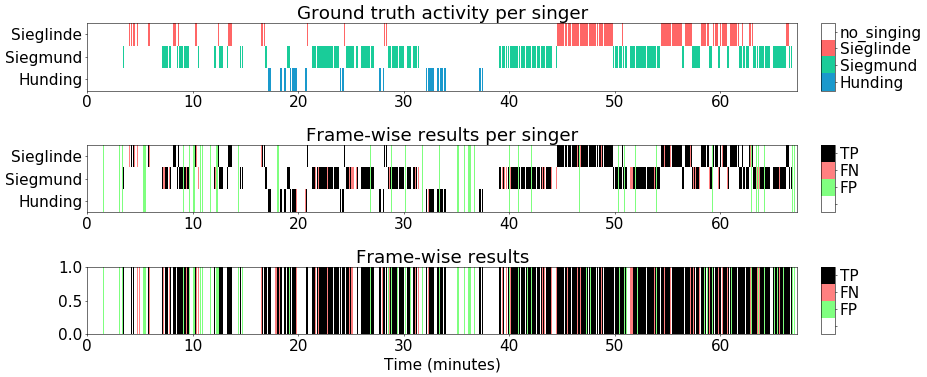

,# frames (annotated),% frames (relative),False Negative Rate (%),False Positive Rate (%),Recall (%),Precision (%),F-Measure (%)
All frames,40380,100.00,8.03,7.47,85.59,86.47,86.03
Sieglinde,7195,17.82,2.13,0.00,88.05,0.00,0.00
Siegmund,13077,32.38,4.95,0.00,84.73,0.00,0.00
Hunding,2263,5.60,0.96,0.00,82.90,0.00,0.00


In [88]:
# From now on, use only ground truth fram table!

true_pos_fw = np.multiply((results_fw==ground_truth_from_table), ground_truth_from_table)
false_neg_fw = np.multiply((results_fw==0), (ground_truth_from_table==1))
false_pos_fw = np.multiply((results_fw==1), (ground_truth_from_table==0))

true_pos_sieglinde = np.multiply(true_pos_fw, (activity_sieglinde>0))
false_neg_sieglinde = np.multiply(false_neg_fw, (activity_sieglinde>0))
false_pos_sieglinde = false_pos_fw  # cannot assign false positive activity to a singer!

true_pos_siegmund = np.multiply(true_pos_fw, (activity_siegmund>0))
false_neg_siegmund = np.multiply(false_neg_fw, (activity_siegmund>0))
false_pos_siegmund = false_pos_fw  # cannot assign false positive activity to a singer!

true_pos_hunding = np.multiply(true_pos_fw, (activity_hunding>0))
false_neg_hunding = np.multiply(false_neg_fw, (activity_hunding>0))
false_pos_hunding = false_pos_fw  # cannot assign false positive activity to a singer!

visualization_sieglinde = np.reshape(3 * true_pos_sieglinde + 2 * false_neg_sieglinde + 1 * false_pos_sieglinde, [1, num_frames])
visualization_siegmund = np.reshape(3 * true_pos_siegmund + 2 * false_neg_siegmund + 1 * false_pos_siegmund, [1, num_frames])
visualization_hunding = np.reshape(3 * true_pos_hunding + 2 * false_neg_hunding + 1 * false_pos_hunding, [1, num_frames])

visualization_per_singer = np.concatenate((visualization_hunding, visualization_siegmund, visualization_sieglinde), axis=0)


plt.figure(figsize=(19, 8), dpi=50)
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

im = ax0.imshow(activity_by_singer, origin='lower', aspect='auto', cmap=discrete_cmap2, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax0.set_yticks(np.array([0, 1, 2])+0.5)
ax0.set_yticklabels(['Hunding', 'Siegmund', 'Sieglinde'])
cbar = plt.colorbar(im, cax=ax1, cmap=discrete_cmap, ticks=[0, 1, 2, 3], norm=norm, boundaries=bounds) 
cbar.ax.set_yticklabels(['no_singing', 'Sieglinde', 'Siegmund', 'Hunding'])
cbar.ax.invert_yaxis()
ax0.set_title('Ground truth activity per singer')

im = ax2.imshow(visualization_per_singer, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax2.set_yticks(np.array([0, 1, 2])+0.5)
ax2.set_yticklabels(['Hunding', 'Siegmund', 'Sieglinde'])
cbar = plt.colorbar(im, cax=ax3, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax2.set_title('Frame-wise results per singer')

im = ax4.imshow(visualization_fw, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax5, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax4.set_title('Frame-wise results')
ax4.set_xlabel('Time (minutes)')

plt.tight_layout()
plt.show()

recall_sieglinde = np.sum(true_pos_sieglinde)/(np.sum(true_pos_sieglinde)+np.sum(false_neg_sieglinde))
recall_siegmund = np.sum(true_pos_siegmund)/(np.sum(true_pos_siegmund)+np.sum(false_neg_siegmund))
recall_hunding = np.sum(true_pos_hunding)/(np.sum(true_pos_hunding)+np.sum(false_neg_hunding))

# all_errors = (results_fw!=ground_truth_fw)
all_errors = false_neg_fw + false_pos_fw

falseneg_rate_sieglinde = np.sum(false_neg_sieglinde)/num_frames
falseneg_rate_siegmund = np.sum(false_neg_siegmund)/num_frames
falseneg_rate_hunding = np.sum(false_neg_hunding)/num_frames
falseneg_rate_allsingers = np.sum(false_neg_fw)/num_frames
falsepos_rate = np.sum(false_pos_fw)/num_frames
error_rate_allsingers = np.sum(all_errors)/num_frames

annotated_frames = np.array([num_frames, np.sum(activity_sieglinde>0), np.sum(activity_siegmund>0), np.sum(activity_hunding>0)])
annotated_frames_relative = 100*annotated_frames/num_frames
falseneg_rates = 100*np.array([falseneg_rate_allsingers, falseneg_rate_sieglinde, falseneg_rate_siegmund, falseneg_rate_hunding])
falsepos_rates = 100*np.array([falsepos_rate, 0, 0, 0])
recalls = 100*np.array([recall_fw, recall_sieglinde, recall_siegmund, recall_hunding])
precisions = 100*np.array([precision_fw, 0, 0, 0])
fmeas_all = 100*np.array([f_meas_fw, 0, 0, 0])

pd.set_option('display.max_colwidth', -1)    
df = pd.DataFrame(OrderedDict([('# frames (annotated)', annotated_frames),
                               ('% frames (relative)', annotated_frames_relative),
                               ('False Negative Rate (%)', falseneg_rates),
                               ('False Positive Rate (%)', falsepos_rates),
                               ('Recall (%)', recalls),
                               ('Precision (%)', precisions),
                               ('F-Measure (%)', fmeas_all)
                              ]))

df.index = ['All frames', 'Sieglinde', 'Siegmund', 'Hunding']
ipd.HTML(df.to_html(escape=False, float_format='%.2f'))

### Temporal Continuity - Does Smoothing Help?

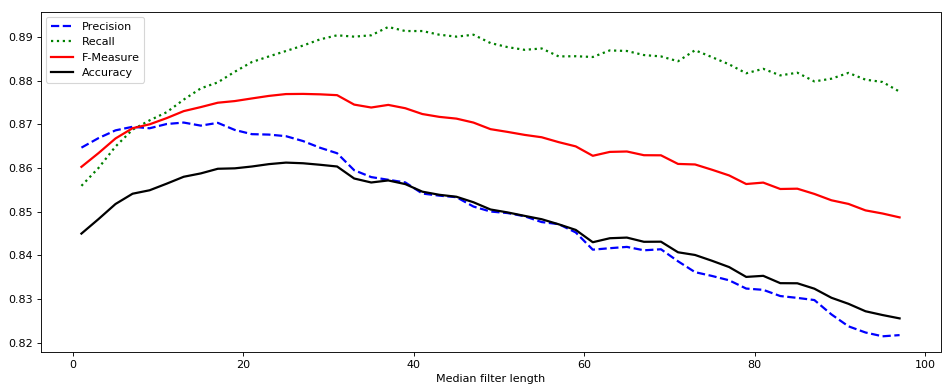

In [9]:
from scipy.signal import medfilt as medfilt

filter_lengths = np.arange(1,99,2)

precision_sweep = np.zeros(filter_lengths.shape)
recall_sweep = np.zeros(filter_lengths.shape)
fmeas_sweep = np.zeros(filter_lengths.shape)
accuracy_sweep = np.zeros(filter_lengths.shape)

i=0
for l in filter_lengths:
    results_filtered = medfilt(results_fw, kernel_size=l)
    precision_sweep[i] = np.dot(results_filtered, ground_truth_from_table)/np.sum(results_filtered)
    recall_sweep[i] = np.dot(results_filtered, ground_truth_from_table)/np.sum(ground_truth_from_table)
    fmeas_sweep[i] = 2*precision_sweep[i]*recall_sweep[i] / (precision_sweep[i]+recall_sweep[i])
    accuracy_sweep[i] = np.sum(results_filtered==ground_truth_from_table)/num_frames
    # print('Filter length %2.f done. Fmeas=%.2f ' % (l, 100*fmeas_sweep[i]))
    i+=1


fig = plt.figure(figsize=(12, 5), dpi=80)

ax = fig.add_subplot(1,1,1)
ax.plot(filter_lengths, precision_sweep, marker=None, color='blue', linewidth=2, linestyle='dashed')
ax.plot(filter_lengths, recall_sweep, marker=None, color='green', linewidth=2, linestyle='dotted')
ax.plot(filter_lengths, fmeas_sweep, marker=None, color='red', linewidth=2)
ax.plot(filter_lengths, accuracy_sweep, marker=None, color='black', linewidth=2)
ax.legend(('Precision', 'Recall', 'F-Measure', 'Accuracy'))
ax.set_xlabel('Median filter length')

plt.tight_layout()
plt.show()


## Listen to Some Errors ...

In [67]:
import itertools
import operator

# we use the median-filtered results
kernel_size = 25
results_filtered = medfilt(results_fw, kernel_size=kernel_size)

true_pos_filtered = np.multiply((results_filtered==ground_truth_from_table), ground_truth_from_table)
false_neg_filtered = np.multiply((results_filtered==0), (ground_truth_from_table==1))
false_pos_filtered = np.multiply((results_filtered==1), (ground_truth_from_table==0))

print('false positives: %.1f %%' % (100*np.sum(false_pos_fw)/num_frames))
print('false negatives: %.1f %%' % (100*np.sum(false_neg_fw)/num_frames))

all_errors_filtered = np.reshape(results_filtered!=ground_truth_from_table, [1, num_frames])
ground_truth_labels_fw = np.reshape(ground_truth_from_table, [1, num_frames])

false_pos_blocks = [[i for i,value in it] for key,it in itertools.groupby(enumerate(false_pos_filtered), key=operator.itemgetter(1)) if key != 0]
false_neg_blocks = [[i for i,value in it] for key,it in itertools.groupby(enumerate(false_neg_filtered), key=operator.itemgetter(1)) if key != 0]

print('')
print('***************************************************************************************')
print('* EXAMPLES - FALSE POSITIVES **********************************************************')
print('***************************************************************************************')
print('')

min_block_length = 35   # minimal number of wrong frames 

for block in range(len(false_pos_blocks)):
    if len(false_pos_blocks[block])>=min_block_length:
        start_frame = false_pos_blocks[block][0]
        end_frame = false_pos_blocks[block][-1]
        start_sample = librosa.frames_to_samples(start_frame, hop_length=Fs/frame_rate)
        end_sample = librosa.frames_to_samples(end_frame, hop_length=Fs/frame_rate)
        print('duration: '+str((end_sample-start_sample)/Fs)+' seconds, start time '+str(start_sample/(Fs*60))+' minutes')
        ipd.display(ipd.Audio(data=f_audio[start_sample:end_sample], rate=Fs))

print('')
print('***************************************************************************************')
print('* EXAMPLES - FALSE NEGATIVES **********************************************************')
print('***************************************************************************************')
print('')

for block in range(len(false_neg_blocks)):
    if len(false_neg_blocks[block])>=min_block_length:
        start_frame = false_neg_blocks[block][0]
        end_frame = false_neg_blocks[block][-1]
        start_sample = librosa.frames_to_samples(start_frame, hop_length=Fs/frame_rate)
        end_sample = librosa.frames_to_samples(end_frame, hop_length=Fs/frame_rate)
        print('duration: '+str((end_sample-start_sample)/Fs)+' seconds, start time '+str(start_sample/(Fs*60))+' minutes')
        ipd.display(ipd.Audio(data=f_audio[start_sample:end_sample], rate=Fs))


false positives: 7.5 %
false negatives: 8.0 %

***************************************************************************************
* EXAMPLES - FALSE POSITIVES **********************************************************
***************************************************************************************

duration: 5.2 seconds, start time 3.365 minutes


duration: 3.9 seconds, start time 5.383333333333334 minutes


duration: 9.4 seconds, start time 5.48 minutes


duration: 9.6 seconds, start time 9.733333333333333 minutes


duration: 4.4 seconds, start time 10.911666666666667 minutes


duration: 11.5 seconds, start time 18.006666666666668 minutes


duration: 3.6 seconds, start time 29.391666666666666 minutes


duration: 4.1 seconds, start time 33.73166666666667 minutes


duration: 4.8 seconds, start time 36.6 minutes


duration: 3.5 seconds, start time 56.306666666666665 minutes


duration: 4.5 seconds, start time 63.51833333333333 minutes


duration: 9.5 seconds, start time 66.89166666666667 minutes



***************************************************************************************
* EXAMPLES - FALSE NEGATIVES **********************************************************
***************************************************************************************

duration: 7.0 seconds, start time 10.508333333333333 minutes


duration: 4.0 seconds, start time 21.56833333333333 minutes


duration: 7.4 seconds, start time 25.013333333333332 minutes


duration: 4.1 seconds, start time 25.221666666666668 minutes


duration: 3.5 seconds, start time 30.653333333333332 minutes


duration: 6.7 seconds, start time 31.32 minutes


duration: 7.3 seconds, start time 43.45166666666667 minutes


duration: 6.0 seconds, start time 43.623333333333335 minutes


duration: 5.0 seconds, start time 43.763333333333335 minutes


duration: 6.4 seconds, start time 43.888333333333335 minutes


duration: 5.3 seconds, start time 51.40833333333333 minutes


duration: 6.4 seconds, start time 51.596666666666664 minutes


duration: 4.7 seconds, start time 60.105 minutes


## Analyze Correlations to Certain Instrument's Activities

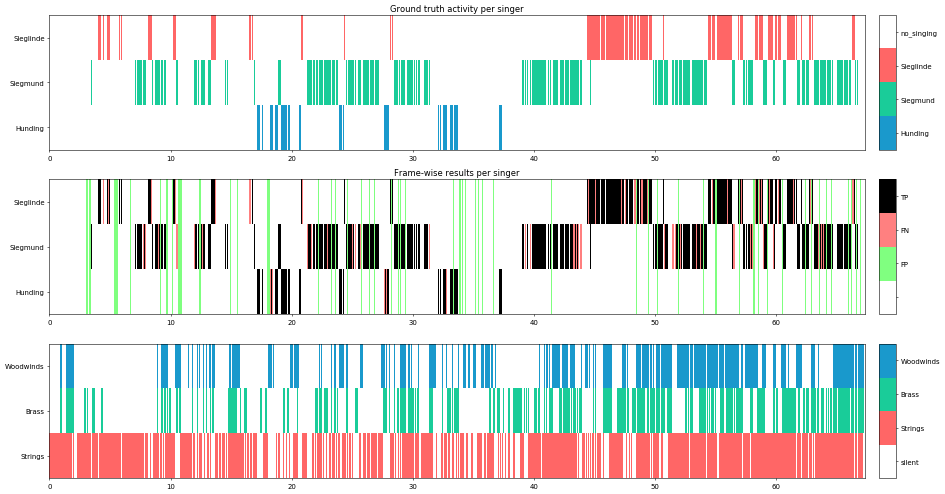

In [11]:
import scipy.io as sio

instrument_file_path = os.path.join('H:', os.sep, 'workspace','matlab','Wagner_Sync_Output','instfamiliesKarajan.mat')
mat_content = sio.loadmat(instrument_file_path)
instrument_fam_activities = mat_content['familyActivities'][:,0:-1]
three_fam_activities = np.multiply(np.reshape(np.array(([1, 2, 3])),[3, 1]), instrument_fam_activities[np.array(([5, 1, 0])),:])

plt.figure(figsize=(19, 10), dpi=50)
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

im = ax0.imshow(activity_by_singer, origin='lower', aspect='auto', cmap=discrete_cmap2, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax0.set_yticks(np.array([0, 1, 2])+0.5)
ax0.set_yticklabels(['Hunding', 'Siegmund', 'Sieglinde'])
cbar = plt.colorbar(im, cax=ax1, cmap=discrete_cmap, ticks=[0, 1, 2, 3], norm=norm, boundaries=bounds) 
cbar.ax.set_yticklabels(['no_singing', 'Sieglinde', 'Siegmund', 'Hunding'])
cbar.ax.invert_yaxis()
ax0.set_title('Ground truth activity per singer')

im = ax2.imshow(visualization_per_singer, origin='lower', aspect='auto', cmap=discrete_cmap, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax2.set_yticks(np.array([0, 1, 2])+0.5)
ax2.set_yticklabels(['Hunding', 'Siegmund', 'Sieglinde'])
cbar = plt.colorbar(im, cax=ax3, cmap=discrete_cmap, norm=norm, boundaries=bounds, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['', 'FP', 'FN', 'TP'])
ax2.set_title('Frame-wise results per singer')

im = ax4.imshow(three_fam_activities, origin='lower', aspect='auto', cmap=discrete_cmap2, extent=[t_min_minutes, t_max_minutes, 0, 3])
ax4.set_yticks(np.array([0, 1, 2])+0.5)
ax4.set_yticklabels(['Strings', 'Brass', 'Woodwinds'])
cbar = plt.colorbar(im, cax=ax5, cmap=discrete_cmap, ticks=[0, 1, 2, 3], norm=norm, boundaries=bounds) 
cbar.ax.set_yticklabels(['silent', 'Strings', 'Brass', 'Woodwinds'])
#cbar.ax.invert_yaxis()
ax0.set_title('Ground truth activity per singer')


plt.tight_layout()
plt.show()

## Instrument Family Statistics

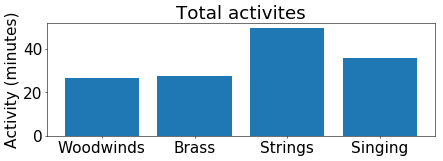

In [24]:
woodwind_activities = mat_content['familyActivities'][0,0:-1]
brass_activities = mat_content['familyActivities'][1,0:-1]
strings_activities = mat_content['familyActivities'][5,0:-1]
singing_activities = mat_content['familyActivities'][4,0:-1]

woodwind_minutes = np.sum(woodwind_activities)/(60*frame_rate)
brass_minutes = np.sum(brass_activities)/(60*frame_rate)
strings_minutes = np.sum(strings_activities)/(60*frame_rate)
singing_minutes = np.sum(singing_activities)/(60*frame_rate)

plt.figure(figsize=(10, 3), dpi=50)

plt.bar(np.arange(4), height=[woodwind_minutes, brass_minutes, strings_minutes, singing_minutes])
plt.xticks(np.arange(4), ['Woodwinds', 'Brass', 'Strings', 'Singing'])
plt.rcParams.update({'font.size': 22})
plt.ylabel('Activity (minutes)')
plt.title('Total activites')
#plt.tight_layout()
plt.show()

(40380,)
(40380,)
0.936998514115899


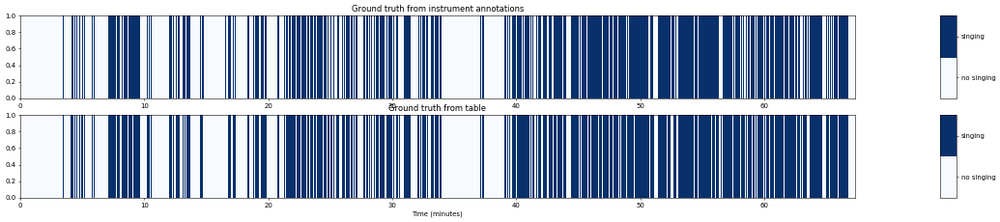

In [22]:
%matplotlib inline

print(ground_truth_from_table.shape)
print(singing_activities.shape)

validate_singing_annot = np.sum(singing_activities==ground_truth_from_table)/num_frames
print(validate_singing_annot)

# for offset in range(40):
#     singing_activities_nooffset = np.concatenate((np.zeros((offset)), singing_activities[:-offset]), axis=0)
#     validate_singing_corrected = np.sum(singing_activities_nooffset==ground_truth_from_table)/ground_truth_from_table.shape[0]
#     print('offset '+str(offset)+' score: '+str(validate_singing_corrected))


plt.figure(figsize=(25, 5), dpi=50)
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 0.02])

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])

im = ax0.imshow(np.reshape(singing_activities, [1, num_frames]), origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax1, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax0.set_title('Ground truth from instrument annotations')

im = ax2.imshow(np.reshape(ground_truth_from_table, [1, num_frames]), origin='lower', aspect='auto', cmap=blues, extent=[t_min_minutes, t_max_minutes, 0, 1])
cbar = plt.colorbar(im, cax=ax3, cmap=blues, norm=normBlues, boundaries=boundsBlues,  ticks=[0, 1])
cbar.ax.set_yticklabels(['no singing', 'singing'])
ax2.set_title('Ground truth from table')
ax2.set_xlabel('Time (minutes)')

# plt.tight_layout()
plt.show()

In [17]:
# Export singing voice regions from instrument annotations for validation

singing_blocks = [[i for i,value in it] for key,it in itertools.groupby(enumerate(singing_activities), key=operator.itemgetter(1)) if key != 0]

df = pd.DataFrame([[0, 0]], columns=['start_time', 'end_time'])

for block in range(len(singing_blocks)):
    start_frame = singing_blocks[block][0]
    end_frame = singing_blocks[block][-1]
    start_time = librosa.frames_to_time(start_frame, sr=Fs, hop_length=Fs/frame_rate)
    end_time = librosa.frames_to_time(end_frame, sr=Fs, hop_length=Fs/frame_rate)
    df = df.append(pd.DataFrame([[start_time, end_time]], columns=['start_time', 'end_time']))
    
csv_path = os.path.join('H:', os.sep, 'workspace','python','ISAD_wagner_vad','test_annot.csv')

df.to_csv(csv_path)

### Compute overlap between false positives and instrument family activities

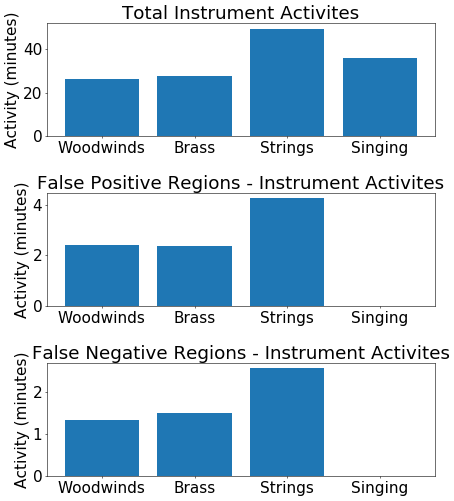

In [71]:
fp_woodwind = np.dot(woodwind_activities, 1*false_pos_filtered)/(60*frame_rate)
fp_brass = np.dot(brass_activities, 1*false_pos_filtered)/(60*frame_rate)
fp_strings = np.dot(strings_activities, 1*false_pos_filtered)/(60*frame_rate)

fn_woodwind = np.dot(woodwind_activities, 1*false_neg_filtered)/(60*frame_rate)
fn_brass = np.dot(brass_activities, 1*false_neg_filtered)/(60*frame_rate)
fn_strings = np.dot(strings_activities, 1*false_neg_filtered)/(60*frame_rate)

fig = plt.figure(figsize=(10, 12), dpi=50)
gs = gridspec.GridSpec(3, 1)

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[1, 0])
ax2 = plt.subplot(gs[2, 0])

im = ax0.bar(np.arange(4), height=[woodwind_minutes, brass_minutes, strings_minutes, singing_minutes])
ax0.set_xticklabels(['', 'Woodwinds', 'Brass', 'Strings', 'Singing'])
plt.rcParams.update({'font.size': 22})
ax0.set_ylabel('Activity (minutes)')
ax0.set_title('Total Instrument Activites')

im = ax1.bar(np.arange(4), height=[fp_woodwind, fp_brass, fp_strings, 0])
ax1.set_xticklabels(['', 'Woodwinds', 'Brass', 'Strings', 'Singing'])
ax1.set_ylabel('Activity (minutes)')
ax1.set_title('False Positive Regions - Instrument Activites')

im = ax2.bar(np.arange(4), height=[fn_woodwind, fn_brass, fn_strings, 0])
ax2.set_xticklabels(['', 'Woodwinds', 'Brass', 'Strings', 'Singing'])
ax2.set_ylabel('Activity (minutes)')
ax2.set_title('False Negative Regions - Instrument Activites')

fig.subplots_adjust(hspace=0.5)

#plt.tight_layout()
plt.show()

59.62833333333333


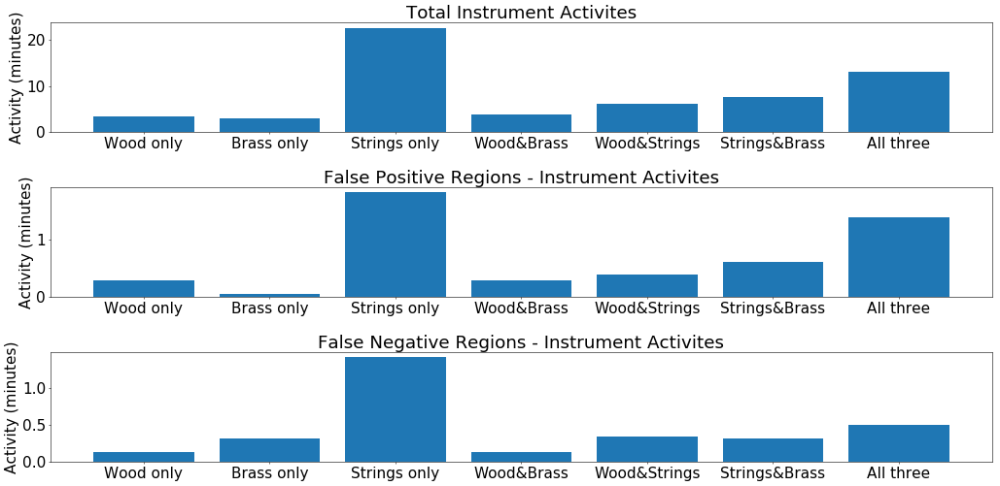

In [87]:
import scipy as sp

woodwind_only = woodwind_activities*sp.logical_not(brass_activities)*sp.logical_not(strings_activities)
brass_only = brass_activities*sp.logical_not(woodwind_activities)*sp.logical_not(strings_activities)
strings_only = strings_activities*sp.logical_not(brass_activities)*sp.logical_not(woodwind_activities)

woodwind_brass = np.multiply(woodwind_activities, brass_activities)*sp.logical_not(strings_activities)
woodwind_strings =  np.multiply(woodwind_activities, strings_activities)*sp.logical_not(brass_activities)
strings_brass = np.multiply(strings_activities, brass_activities)*sp.logical_not(woodwind_activities)

all_families = np.multiply(np.multiply(strings_activities, brass_activities), woodwind_activities)

# total
min_woodwind_only = np.sum(1*woodwind_only)/(60*frame_rate)
min_brass_only = np.sum(1*brass_only)/(60*frame_rate)
min_strings_only = np.sum(1*strings_only)/(60*frame_rate)

min_woodwind_brass = np.sum(1*woodwind_brass)/(60*frame_rate)
min_woodwind_strings = np.sum(1*woodwind_strings)/(60*frame_rate)
min_strings_brass = np.sum(1*strings_brass)/(60*frame_rate)

min_all_families = np.sum(1*all_families)/(60*frame_rate)

# false pos
fp_woodwind_only = np.dot(1*woodwind_only, 1*false_pos_filtered)/(60*frame_rate)
fp_brass_only = np.dot(1*brass_only, 1*false_pos_filtered)/(60*frame_rate)
fp_strings_only = np.dot(1*strings_only, 1*false_pos_filtered)/(60*frame_rate)

fp_woodwind_brass = np.dot(1*woodwind_only, 1*false_pos_filtered)/(60*frame_rate)
fp_woodwind_strings = np.dot(1*woodwind_strings, 1*false_pos_filtered)/(60*frame_rate)
fp_strings_brass = np.dot(1*strings_brass, 1*false_pos_filtered)/(60*frame_rate)

fp_all_families = np.dot(1*all_families, 1*false_pos_filtered)/(60*frame_rate)

# false neg
fn_woodwind_only = np.dot(1*woodwind_only, 1*false_neg_filtered)/(60*frame_rate)
fn_brass_only = np.dot(1*brass_only, 1*false_neg_filtered)/(60*frame_rate)
fn_strings_only = np.dot(1*strings_only, 1*false_neg_filtered)/(60*frame_rate)

fn_woodwind_brass = np.dot(1*woodwind_only, 1*false_neg_filtered)/(60*frame_rate)
fn_woodwind_strings = np.dot(1*woodwind_strings, 1*false_neg_filtered)/(60*frame_rate)
fn_strings_brass = np.dot(1*strings_brass, 1*false_neg_filtered)/(60*frame_rate)

fn_all_families = np.dot(1*all_families, 1*false_neg_filtered)/(60*frame_rate)

# check total duration of all combinations
print(np.sum([min_woodwind_only, min_brass_only, min_strings_only, min_woodwind_brass, min_woodwind_strings, min_strings_brass, min_all_families]))

fig = plt.figure(figsize=(25, 12), dpi=50)
gs = gridspec.GridSpec(3, 1)

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[1, 0])
ax2 = plt.subplot(gs[2, 0])

im = ax0.bar(np.arange(7), height=[min_woodwind_only, min_brass_only, min_strings_only, min_woodwind_brass, min_woodwind_strings, min_strings_brass, min_all_families])
ax0.set_xticklabels(['', 'Wood only', 'Brass only', 'Strings only', 'Wood&Brass', 'Wood&Strings', 'Strings&Brass', 'All three'])
plt.rcParams.update({'font.size': 22})
ax0.set_ylabel('Activity (minutes)')
ax0.set_title('Total Instrument Activites')

im = ax1.bar(np.arange(7), height=[fp_woodwind_only, fp_brass_only, fp_strings_only, fp_woodwind_brass, fp_woodwind_strings, fp_strings_brass, fp_all_families])
ax1.set_xticklabels(['', 'Wood only', 'Brass only', 'Strings only', 'Wood&Brass', 'Wood&Strings', 'Strings&Brass', 'All three'])
ax1.set_ylabel('Activity (minutes)')
ax1.set_title('False Positive Regions - Instrument Activites')

im = ax2.bar(np.arange(7), height=[fn_woodwind_only, fn_brass_only, fn_strings_only, fn_woodwind_brass, fn_woodwind_strings, fn_strings_brass, fn_all_families])
ax2.set_xticklabels(['', 'Wood only', 'Brass only', 'Strings only', 'Wood&Brass', 'Wood&Strings', 'Strings&Brass', 'All three'])
ax2.set_ylabel('Activity (minutes)')
ax2.set_title('False Negative Regions - Instrument Activites')

fig.subplots_adjust(hspace=0.5)

#plt.tight_layout()
plt.show()

## Analyze dependency on volume

(40380, 1)


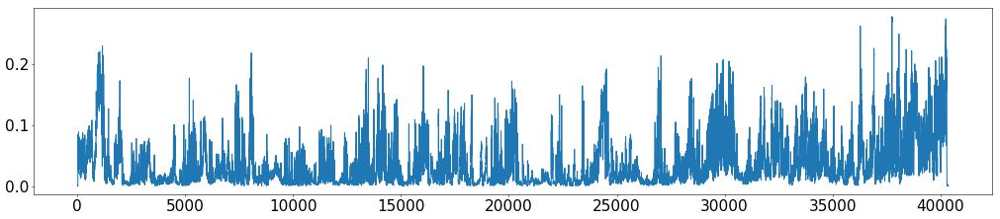

In [143]:
volume_framewise = librosa.feature.rmse(f_audio, frame_length=Fs//frame_rate, hop_length=Fs//frame_rate).T

print(volume_framewise.shape)

plt.figure(figsize=(25, 5), dpi=50)
plt.plot(np.arange(volume_framewise.shape[0]), volume_framewise)
plt.show()

Average volume (all frames):      0.035
Average volume (singing):         0.042
Average volume (no singing):      0.026
Average volume (false positives): 0.038
Average volume (false negatives): 0.020


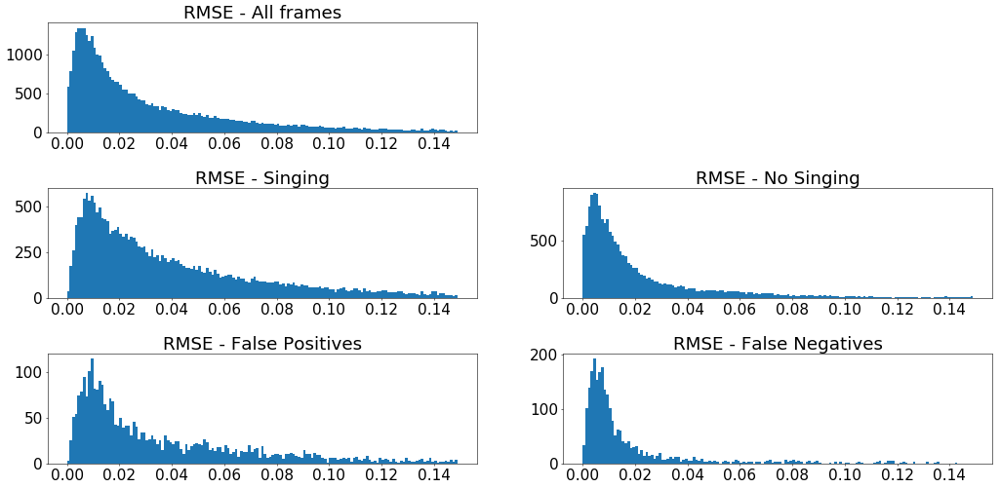

In [151]:
volume_singing = volume_framewise[ground_truth_from_table==1]
volume_nosinging = volume_framewise[ground_truth_inverted_table==1]
volume_fp = volume_framewise[false_pos_filtered==1]
volume_fn = volume_framewise[false_neg_filtered==1]

volume_average = np.mean(volume_framewise)
volume_singing_av = np.dot(volume_framewise.T, 1*ground_truth_from_table)/np.sum(1*ground_truth_from_table)
volume_nosinging_av = np.dot(volume_framewise.T, 1*ground_truth_inverted_table)/np.sum(1*ground_truth_inverted_table)
volume_fp_av = np.dot(volume_framewise.T, 1*false_pos_filtered)/np.sum(1*false_pos_filtered)
volume_fn_av = np.dot(volume_framewise.T, 1*false_neg_filtered)/np.sum(1*false_neg_filtered)

print('Average volume (all frames):      %.3f' % volume_average)
print('Average volume (singing):         %.3f' % volume_singing_av[0])
print('Average volume (no singing):      %.3f' % volume_nosinging_av[0])
print('Average volume (false positives): %.3f' % volume_fp_av[0])
print('Average volume (false negatives): %.3f' % volume_fn_av[0])

fig = plt.figure(figsize=(25, 12), dpi=50)
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1])

ax0 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

im = ax0.hist(volume_framewise, bins=np.arange(0, 0.15, 0.001))
ax0.set_title('RMSE - All frames')

im = ax2.hist(volume_singing, bins=np.arange(0, 0.15, 0.001))
ax2.set_title('RMSE - Singing')

im = ax3.hist(volume_nosinging, bins=np.arange(0, 0.15, 0.001))
ax3.set_title('RMSE - No Singing')

im = ax4.hist(volume_fp, bins=np.arange(0, 0.15, 0.001))
ax4.set_title('RMSE - False Positives')

im = ax5.hist(volume_fn, bins=np.arange(0, 0.15, 0.001))
ax5.set_title('RMSE - False Negatives')

# im = ax1.bar(np.arange(7), height=[fp_woodwind_only, fp_brass_only, fp_strings_only, fp_woodwind_brass, fp_woodwind_strings, fp_strings_brass, fp_all_families])
# ax1.set_xticklabels(['', 'Wood only', 'Brass only', 'Strings only', 'Wood&Brass', 'Wood&Strings', 'Strings&Brass', 'All three'])
# ax1.set_ylabel('Activity (minutes)')
# ax1.set_title('False Positive Regions - Instrument Activites')

# im = ax2.bar(np.arange(7), height=[fn_woodwind_only, fn_brass_only, fn_strings_only, fn_woodwind_brass, fn_woodwind_strings, fn_strings_brass, fn_all_families])
# ax2.set_xticklabels(['', 'Wood only', 'Brass only', 'Strings only', 'Wood&Brass', 'Wood&Strings', 'Strings&Brass', 'All three'])
# ax2.set_ylabel('Activity (minutes)')
# ax2.set_title('False Negative Regions - Instrument Activites')

fig.subplots_adjust(hspace=0.5)

#plt.tight_layout()
plt.show()